In [1]:
import scatlasvae
import torch 
from joblib import dump, load
import os
import random

print(torch.__version__)
print(torch.cuda.is_available())
import scatlasvae
import scanpy as sc


import matplotlib.pyplot as plt
import numpy as np 
import pandas as pd # import pandas
import gc # import garbage collector
from typing import Literal, Union # import typing
!nvidia-smi --query-gpu=name --format=csv,noheader


/omics/odcf/analysis/hipo/hipo_021/Rhode/environments/3_8/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


1.13.1+cu117
False
/bin/bash: line 1: nvidia-smi: command not found


In [2]:
adata_cd8 = sc.read_h5ad("/omics/odcf/analysis/hipo/hipo_021/Rhode/um/dataset_vae/files_scatlasVAE/huARdb_v2_GEX.CD8.hvg4k.h5ad")
num_cells = adata_cd8.shape[0]
print(f"The dataset contains {num_cells} cells.")

The dataset contains 1125712 cells.


In [3]:
## For training the atlas data (only) first and see how it performs overall with the cluster 

#vae_model = scatlasvae.model.scAtlasVAE(
#    adata=adata_cd8,
#    batch_key="sample_name",
#    additional_batch_keys=["study_name"],
#    batch_embedding="embedding",
#    batch_hidden_dim=64,
#)

In [4]:
#vae_model.fit(max_epoch=10, lr=5e-5)
#adata_cd8.obsm["X_gex"] = vae_model.get_latent_embedding(show_progress=True)

In [5]:
#sc.pp.neighbors(adata_cd8, use_rep="X_gex")

In [6]:
#sc.tl.paga(adata_cd8, groups="cell_subtype_3")

In [7]:
# 5. Plot PAGA
#sc.pl.paga(adata_cd8, show=False)

# 6. Run UMAP with PAGA initialization
#sc.tl.umap(adata_cd8, init_pos="paga")

In [8]:
# 7. Plot UMAP
#sc.pl.umap(adata_cd8, color=["cell_subtype_3"])

In [9]:
#sc.pp.neighbors(
#    adata_cd8, use_rep="X_gex", n_neighbors=40
#)  # compute neighborhood graph
#sc.tl.leiden(
#    adata_cd8, resolution=1.2, key_added="leiden_n_neighbors_40_reoslution_1.2"
#)  # compute leiden clustering

In [10]:
#fig, ax = createFig(figsize=(4, 4))
#sc.pl.umap(adata_cd8, color="leiden_n_neighbors_40_reoslution_1.2", ax=ax)

In [11]:
#sc.tl.leiden(
#    adata_cd8, resolution=1.2, key_added="leiden_n_neighbors_40_reoslution_1.2"
#)  # compute leiden clustering

In [12]:
#fig, ax = createFig(figsize=(4, 4))
#sc.pl.umap(adata_cd8, color="leiden_n_neighbors_40_reoslution_1.2", ax=ax)

In [13]:
#sc.tl.paga(adata_cd8, groups='cell_subtype_3')
#sc.pl.paga(adata_cd8, show=False)                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                  
#sc.tl.umap(adata_cd8, init_pos='paga')

In [2]:
#adata_cd8_zheng_2021 = sc.read_h5ad("adata_cd8_zheng.h5ad")
adata_cd8_zheng_2021 = sc.read_h5ad("/omics/odcf/analysis/hipo/hipo_021/Rhode/um/dataset_vae/DS_files_7825/05_UM_CD8_Integrated_Data.h5ad")
adata_cd8_zheng_2021.X = adata_cd8_zheng_2021.layers["raw"]

num_cells = adata_cd8_zheng_2021.shape[0]
print(f"The dataset contains {num_cells} cells.")
#adata_cd8_chu_2023 = sc.read_h5ad("adata_cd8_chu.h5ad")
#adata_um = sc.read_h5ad("../03_UM_T-Cell Analysis.h5ad")

The dataset contains 86024 cells.


In [4]:
adata_cd8_zheng_2021 = sc.read_h5ad("/omics/odcf/analysis/hipo/hipo_021/Rhode/um/dataset_vae/DS_files_7825/05_UM_CD8_Integrated_Data.h5ad")
adata_cd8_zheng_2021

AnnData object with n_obs × n_vars = 86024 × 44001
    obs: 'Sample_Name', 'Cartridge_Project_ID', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'pct_counts_in_top_50_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'tissue', 'Sample', 'source_name', 'stage of tumor progression', 'decisiondx bulk diagnosis', 'experiment_title', 'library_name', 'treatment', 'cell type', 'sex', 'cancer type', 'donor', 'disease state', 'Dataset', 'Dataset_Origin', 'Sex', 'Age', 'Treatment Group', 'type of surgery', 'Metastatic risk', 'Sample Type', 'chr 3', 'chr 8q', 'chr 6p', 'chr 8p', 'chr 1p', 'BAP1_mut', 'SF3B1_mut', 'EIF1AX_mut', 'Other_mut', 'GNAQ_mut', 'GNA11_mut', 'other mut/alteration', 'MYC amplification', 'BAP1 IHC', 'survival status', 'date of death', 'received PBT yes vs. No', '

In [21]:
adata_cd8_zheng_2021.obs['tissue'].value_counts()


UM46                       3056
UM26_pre_PEMDAC_therapy    1549
UM3                        1021
tumor biopsy                977
UM63                        768
UM24                        735
UM9                         511
UM7                         476
UM21                        294
UM19                        255
UM30                        250
uveal melanoma              232
UM2                         221
UM29                        122
Eye                          93
UM25                         48
UM1                          34
UM1_rerun                    19
Name: tissue, dtype: int64

In [13]:
# mask = adata_cd8_zheng_2021.obs['Sample_Name'].str.contains('Nieto', na=False)
# display(adata_cd8_zheng_2021.obs[mask])


,Sample_Name,Cartridge_Project_ID,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_20_genes,pct_counts_in_top_50_genes,total_counts_mt,log1p_total_counts_mt,...,leiden_res0_25_Z_ext,leiden_res0_5_Z_ext,leiden_res1_Z_ext,leiden_res2_Z_ext,leiden_res4_SCVI_ext,leiden_res0_25_SCVI_ext,leiden_res0_5_SCVI_ext,leiden_res1_SCVI_ext,leiden_res2_SCVI_ext,Annotation
index,,,,,,,,,,,,,,,,,,,,,
AAACGCTTCAAGAATG-1-UM3-Nieto-et-al-2021,Nieto_UM3,NaN,1694,7.435438,3248.0,8.086103,18.442118,26.077586,236.0,5.468060,...,2,4,3,5,16,0,0,1,8,CD8 T-Cells - Checkpoint Proteins
AAAGTCCAGCGTCAGA-1-UM3-Nieto-et-al-2021,Nieto_UM3,NaN,1355,7.212294,2444.0,7.801800,17.716858,26.759411,223.0,5.411646,...,2,4,3,5,49,0,4,8,7,CD8 T-Cells - Checkpoint Proteins
AACCAACAGTCAGCCC-1-UM3-Nieto-et-al-2021,Nieto_UM3,NaN,1185,7.078342,2011.0,7.606885,17.553456,26.752859,89.0,4.499810,...,2,4,3,5,49,0,4,8,7,CD8 T-Cells - Checkpoint Proteins
AACCATGAGAGTTGTA-1-UM3-Nieto-et-al-2021,Nieto_UM3,NaN,680,6.523562,1090.0,6.994850,26.880734,36.055046,169.0,5.135798,...,2,4,3,5,49,0,4,8,7,CD8 T-Cells - Checkpoint Proteins
AAGCGTTGTGCAGTGA-1-UM3-Nieto-et-al-2021,Nieto_UM3,NaN,776,6.655440,1327.0,7.191429,19.819141,32.253203,133.0,4.897840,...,2,4,3,5,49,0,4,8,7,CD8 T-Cells - Checkpoint Proteins
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTACGTTTCCACAGCG-1-mUM1-Nieto-et-al-2021,Nieto_mUM1,NaN,2857,7.957877,7129.0,8.872067,17.996914,26.343106,515.0,6.246107,...,5,6,6,14,58,10,7,13,36,CD8 T-Cells
TTCGCTGTCCGCAACG-1-mUM1-Nieto-et-al-2021,Nieto_mUM1,NaN,469,6.152733,815.0,6.704414,22.944785,38.895706,63.0,4.158883,...,5,6,6,9,30,6,10,14,37,CD8 T-Cells
TTCTAACCAAGGTTGG-1-mUM1-Nieto-et-al-2021,Nieto_mUM1,NaN,5650,8.639588,30773.0,10.334425,15.575342,28.804471,2231.0,7.710653,...,2,4,3,4,37,5,4,3,12,CD8 T-Cells - Checkpoint Proteins


In [5]:
adata_cd8_zheng_2021.obs['disease'] = 'UM'
adata_cd8_zheng_2021.obs['study_name'] = 'uveal_melanoma'
adata_cd8_zheng_2021.obs['atlas_name'] = 'um_berlin'
adata_cd8_zheng_2021.obs['disease_type'] = 'UM'


adata_cd8_zheng_2021.obs['sample_name'] = adata_cd8_zheng_2021.obs["Sample_Name"]
adata_cd8_zheng_2021.obs['treatment_group'] = adata_cd8_zheng_2021.obs["Treatment Group"]
#adata_cd8_zheng_2021.obs['sample_name'] = adata_cd8_zheng_2021.obs["CNV Categories"]

#adata_cd8_zheng_2021.obs['cell_subtype_3'] = 'undefined'
#adata_cd8.obs['cell_subtype_zheng_2019'] = 'undefined'
#adata_cd8.obs['atlas_name'] = 'huARdbv2'


adata_cd8_zheng_2021.obs['cell_subtype_3'] = 'undefined'
adata_cd8.obs['Annotation'] = 'undefined'
adata_cd8.obs['atlas_name'] = 'huARdbv2'
adata_cd8.obs['treatment_group'] = 'undefined'
adata_cd8.obs['cnv_group'] = 'undefined'

In [18]:
#merged_adata = sc.concat([reference_adata, query_adata])
#adata_cd8_zheng_2021_merged = sc.concat([
#    adata_cd8_zheng_2021, adata_cd8
#])

In [6]:
adata_cd8_zheng_2021_merged = sc.concat([
    adata_cd8_zheng_2021, adata_cd8
], join='inner')

In [8]:
adata_cd8_zheng_2021_merged.obs['sample_name']

53314-A4069-Cartridge-I3-Berlin-UM       DU_050
60757-A4069-Cartridge-I3-Berlin-UM       DU_050
73218-A4069-Cartridge-I3-Berlin-UM       DU_050
82365-A4069-Cartridge-I3-Berlin-UM       DU_050
90127-A4069-Cartridge-I3-Berlin-UM       DU_050
                                         ...   
TTAGTTCAGCTAAACA-Simone_2021-AS02_SF    AS02_SF
TTCCCAGCAATGCCAT-Simone_2021-AS02_SF    AS02_SF
TTCGAAGAGCTAACTC-Simone_2021-AS02_SF    AS02_SF
TTGCCGTCAATGCCAT-Simone_2021-AS02_SF    AS02_SF
TTGCGTCTCGGATGTT-Simone_2021-AS02_SF    AS02_SF
Name: sample_name, Length: 1211736, dtype: category
Categories (1114, object): ['1_Ki0100020_CMVpos', '2_Ki0100022_CMVneg', '3_Ki0100021_CMVpos', '4_Ki0100015_CMVneg', ..., 'su013_post_Tcell', 'su013_pre_Tcell', 'su014_post_Tcell', 'su014_pre_Tcell']

In [13]:
#adata_cd8_zheng_2021_merged.obs['cell_subtype_3'] = list(adata_cd8_zheng_2021_merged.obs['cell_subtype_3'])
#adata_cd8_zheng_2021_merged.obs['cell_subtype_3'] = adata_cd8_zheng_2021_merged.obs['cell_subtype_3'].fillna("undefined")

In [14]:
adata_cd8_zheng_2021_merged.obs['Annotation'] = adata_cd8_zheng_2021_merged.obs['Annotation'].astype('category')
sc.pp.filter_cells(adata_cd8_zheng_2021_merged, min_counts=50)


In [ ]:
#non_zero_cells = (adata_cd8_zheng_2021_merged.X.sum(1) > 0)

#adata_cd8_zheng_2021_merged = adata_cd8_zheng_2021_merged[non_zero_cells].copy()
#any(np.array(adata_cd8_zheng_2021_merged.X.sum(1) > 0).flatten())

In [12]:
#adata_cd8_zheng_2021_merged.uns

In [13]:
#print((adata_cd8_zheng_2021_merged.X.sum(1) == 0).sum()) 
# Convert to a dense matrix (if it's sparse) and replace zeros with a small positive value
#adata_cd8_zheng_2021_merged.X = adata_cd8_zheng_2021_merged.X.toarray()  # This step converts it to a dense matrix

# Replace any zero values with a small constant (e.g., 1e-5)
#adata_cd8_zheng_2021_merged.X[adata_cd8_zheng_2021_merged.X == 0] = 1e-5

In [ ]:
#multi_atlas_vae_model = scatlasvae.model.scAtlasVAE(
#    adata=adata_cd8_zheng_2021_merged,
#    batch_key='sample_name',
#    additional_batch_keys=['study_name','atlas_name'],
#    batch_embedding='embedding',
#    batch_hidden_dim=10,
#    label_key='cell_subtype_3',
   # additional_label_keys=['Final_Annotation'],
#    device='cuda'
#)

In [48]:
# import numpy as np

# # Sum of counts per cell
# cell_counts = adata_cd8_zheng_2021_merged.X.sum(axis=1)

# # If adata.X is a sparse matrix, convert to array
# if hasattr(cell_counts, 'A1'):
#     cell_counts = cell_counts.A1

# # Identify cells with low total counts
# low_count_cells = np.where(cell_counts < 50)[0]

# print(f"Number of cells with <50 reads: {len(low_count_cells)}")

# sc.pp.filter_cells(adata_cd8_zheng_2021_merged, min_counts=50)

# print(f"Number of cells with <50 reads: {len(low_count_cells)}")


Number of cells with <50 reads: 0
Number of cells with <50 reads: 0


In [ ]:
#from scipy import sparse

#adata_cd8_zheng_2021_merged.X.shape
#adata_cd8_zheng_2021_merged.X = sparse.csr_matrix(adata_cd8_zheng_2021_merged.X.astype(np.int32))

In [12]:
adata_cd8_zheng_2021_merged.obs

,treatment,Annotation,disease,study_name,atlas_name,disease_type,sample_name,treatment_group,cell_subtype_3,n_counts
53314-A4069-Cartridge-I3-Berlin-UM,NaN,CD8 T-Cells - Checkpoint Proteins,UM,uveal_melanoma,um_berlin,UM,DU_050,naive,undefined,1082
60757-A4069-Cartridge-I3-Berlin-UM,NaN,CD8 T-Cells - Checkpoint Proteins,UM,uveal_melanoma,um_berlin,UM,DU_050,naive,undefined,736
73218-A4069-Cartridge-I3-Berlin-UM,NaN,CD8 T-Cells - Checkpoint Proteins,UM,uveal_melanoma,um_berlin,UM,DU_050,naive,undefined,1025
82365-A4069-Cartridge-I3-Berlin-UM,NaN,CD8 T-Cells - Checkpoint Proteins,UM,uveal_melanoma,um_berlin,UM,DU_050,naive,undefined,1377
90127-A4069-Cartridge-I3-Berlin-UM,NaN,CD8 T-Cells - Cycling,UM,uveal_melanoma,um_berlin,UM,DU_050,naive,undefined,1746
...,...,...,...,...,...,...,...,...,...,...
TTAGTTCAGCTAAACA-Simone_2021-AS02_SF,NSAIDs,undefined,Ankylosing spondylitis,Simone_2021,huARdbv2,Inflammation,AS02_SF,undefined,GZMK+ Tex,499
TTCCCAGCAATGCCAT-Simone_2021-AS02_SF,NSAIDs,undefined,Ankylosing spondylitis,Simone_2021,huARdbv2,Inflammation,AS02_SF,undefined,GZMK+ Tem,551
TTCGAAGAGCTAACTC-Simone_2021-AS02_SF,NSAIDs,undefined,Ankylosing spondylitis,Simone_2021,huARdbv2,Inflammation,AS02_SF,undefined,Tcm,1016
TTGCCGTCAATGCCAT-Simone_2021-AS02_SF,NSAIDs,undefined,Ankylosing spondylitis,Simone_2021,huARdbv2,Inflammation,AS02_SF,undefined,GZMK+ Tex,1340


In [15]:
# multi_atlas_vae_model = scatlasvae.model.scAtlasVAE(
#     adata=adata_cd8_zheng_2021_merged,
#     batch_key='sample_name',
#     additional_batch_keys=['study_name','atlas_name'],
#     batch_embedding='embedding',
#     batch_hidden_dim=64,
#     label_key='cell_subtype_3',
#     additional_label_keys=['Annotation'],
#     device='cuda:0'
# )

multi_atlas_vae_model = scatlasvae.model.scAtlasVAE(
    adata=adata_cd8_zheng_2021_merged,
    batch_key='sample_name',
    additional_batch_keys=['study_name','atlas_name'],
    batch_embedding='embedding',
    batch_hidden_dim=10,
    label_key='cell_subtype_3',
    additional_label_keys=['Annotation'],
    device='cuda:0',
    pretrained_state_dict="/omics/odcf/analysis/hipo/hipo_021/Rhode/um/dataset_vae/DS_files_7825/retrained_vae_model.pt"
)



Sat Jan  3 06:01:52 2026 - scAtlasVAE - WARNING - 	adata.X is not of type np.int32. 
                                        	Check whether you are using raw count matrix.
Sat Jan  3 06:01:52 2026 - scAtlasVAE - WARNING - 	additional_batch_keys is going to be deprecated. Use batch_key as a List instead.
Sat Jan  3 06:01:52 2026 - scAtlasVAE - WARNING - 	additional_label_keys is going to be deprecated. Use label_key as a List instead.
Sat Jan  3 06:01:53 2026 - scAtlasVAE - INFO - 	Initializing dataset into memory
Sat Jan  3 06:01:56 2026 - scAtlasVAE - INFO - 	warning: the provided n_batch=0 does not match the number of batch in the adata.
Sat Jan  3 06:01:56 2026 - scAtlasVAE - INFO - 	         setting n_batch to 1114
Sat Jan  3 06:01:56 2026 - scAtlasVAE - INFO - 	warning: the provided n_label=0 does not match the number of label in the adata.
Sat Jan  3 06:01:56 2026 - scAtlasVAE - INFO - 	         setting n_label to 18
Sat Jan  3 06:02:08 2026 - scAtlasVAE - INFO - 	warning: the pr

In [ ]:
multi_atlas_vae_model.fit(
    max_epoch=32, 
    lr=1e-5,
    kl_weight=1.,
    n_epochs_kl_warmup=16
)

In [11]:
# Train multi_atlas_vae_model with adjusted parameters
multi_atlas_vae_model.fit()

Fri Jan  2 14:50:26 2026 - scAtlasVAE - INFO - 	max_epoch is not provided, setting max_epoch to 7


Epoch 7: 100%|██████████| 7/7 [25:20<00:00, 217.15s/it, rec=1.23e+05, kl=1.99e+03, pred=2.68e+01, mmd=0.00e+00]                  


{'epoch_total_loss_list': [9225169.254221851,
  7728900.740445775,
  nan,
  nan,
  7597435.823800475,
  nan,
  nan],
 'epoch_reconstruction_loss_list': [7863292.525695801,
  7381394.518188477,
  7326280.639160156,
  7298265.976257324,
  7286446.846008301,
  7275638.989929199,
  7268412.071777344],
 'epoch_kldiv_loss_list': [173308.52859306335,
  260433.38092041016,
  231218.29720306396,
  199207.99507904053,
  173651.01061058044,
  155104.13131332397,
  140354.14370632172],
 'epoch_prediction_loss_list': [265101.08182364615,
  133681.43761918435,
  106395.9442335159,
  96584.58208634496,
  92116.38436031679,
  89150.6476927676,
  87885.67243307596],
 'epoch_mmd_loss_list': [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0],
 'epoch_gate_loss_list': [805601.5004249811,
  2119.3196273334324,
  57.12987545633223,
  10.603431303432444,
  11.584775973373326,
  19.042593020712957,
  26.809567129064817],
 'epoch_constraint_loss_list': [0, 0, 0, 0, 0, 0, 0]}

In [23]:
#adata_cd8_zheng_2021_merged.obsm['X_gex'] = multi_atlas_vae_model.get_latent_embedding()

#predictions = multi_atlas_vae_model.predict_labels(return_pandas=True)
#predictions.columns = list(map(lambda x: 'predicted_'+x, predictions.columns))
#adata_cd8_zheng_2021_merged.obs = adata_cd8_zheng_2021_merged.obs.join(predictions)

#predictions_logits = multi_atlas_vae_model.predict_labels(return_pandas=False)
#adata_cd8_zheng_2021_merged.uns['predictions_logits'] = predictions_logits

In [11]:
??multi_atlas_vae_model.fit

Signature:
multi_atlas_vae_model.fit(
    max_epoch: Union[int, NoneType] = None,
    n_per_batch: int = 128,
    kl_weight: float = 1.0,
    pred_weight: float = 1.0,
    mmd_weight: float = 1.0,
    gate_weight: float = 1.0,
    constrain_weight: float = 1.0,
    optimizer_parameters: Iterable = None,
    validation_split: float = 0.2,
    lr: bool = 5e-05,
    lr_schedule: bool = False,
    lr_factor: float = 0.6,
    lr_patience: int = 30,
    lr_threshold: float = 0.0,
    lr_min: float = 1e-06,
    n_epochs_kl_warmup: Union[int, NoneType] = 400,
    weight_decay: float = 1e-06,
    random_seed: int = 12,
    subset_indices: Union[<built-in method tensor of type object at 0x1521824dc420>, numpy.ndarray] = None,
    pred_last_n_epoch: int = 10,
    pred_last_n_epoch_fconly: bool = False,
    compute_batch_after_n_epoch: int = 0,
    reconstruction_reduction: str = 'sum',
    n_concurrent_batch: int = 1,
)
Source:   
    def fit(self,
        max_epoch: Optional[int] = None,
       

In [ ]:
model = multi_atlas_vae_model
torch.save(model.state_dict(), '11_11_model_default.pt')

# ... after training, save your model 
#model.save_state_dict('8_8_model_um_5e_5.pt')

In [ ]:
multi_atlas_vae_model.load_state_dict(torch.load('11_11_model_default.pt'))


In [22]:
adata_cd8_zheng_2021_merged.obs

,Annotation,disease,study_name,atlas_name,sample_name,treatment_group,cnv_group,cell_subtype_3,n_counts
53314-A4069-Cartridge-I3,CD8 T-cells - Checkpoint,UM,uveal_melanoma,um_berlin,DU_050,naive,M3,undefined,937
60757-A4069-Cartridge-I3,CD8 T-cells - Checkpoint,UM,uveal_melanoma,um_berlin,DU_050,naive,M3,undefined,601
73218-A4069-Cartridge-I3,CD8 T-cells - Checkpoint,UM,uveal_melanoma,um_berlin,DU_050,naive,M3,undefined,860
82365-A4069-Cartridge-I3,CD8 T-cells - Checkpoint,UM,uveal_melanoma,um_berlin,DU_050,naive,M3,undefined,1061
90127-A4069-Cartridge-I3,CD8 T-Cells - Cycling,UM,uveal_melanoma,um_berlin,DU_050,naive,M3,undefined,1511
...,...,...,...,...,...,...,...,...,...
TTAGTTCAGCTAAACA-Simone_2021-AS02_SF,undefined,Ankylosing spondylitis,Simone_2021,huARdbv2,AS02_SF,undefined,undefined,GZMK+ Tex,492
TTCCCAGCAATGCCAT-Simone_2021-AS02_SF,undefined,Ankylosing spondylitis,Simone_2021,huARdbv2,AS02_SF,undefined,undefined,GZMK+ Tem,546
TTCGAAGAGCTAACTC-Simone_2021-AS02_SF,undefined,Ankylosing spondylitis,Simone_2021,huARdbv2,AS02_SF,undefined,undefined,Tcm,999
TTGCCGTCAATGCCAT-Simone_2021-AS02_SF,undefined,Ankylosing spondylitis,Simone_2021,huARdbv2,AS02_SF,undefined,undefined,GZMK+ Tex,1322


In [ ]:
#import umap 
#adata_cd8_zheng_2021_merged.obsm['X_gex'] = multi_atlas_vae_model.get_latent_embedding()
#adata_cd8_zheng_2021_merged.obsm['X_umap'] = umap.UMAP().fit_transform(adata_cd8_zheng_2021_merged.obsm['X_gex'])



#predictions = multi_atlas_vae_model.predict_labels(return_pandas=True)
#predictions_logits = multi_atlas_vae_model.predict_labels(return_pandas=False)
#adata_cd8_zheng_2021_merged.uns['cell_subtype_3_prediction_logits'] = predictions_logits[0].detach().cpu().numpy()
#adata_cd8_zheng_2021_merged.uns['cell_subtype_zheng_2021_prediction_logits'] = predictions_logits[1][0].detach().cpu().numpy()
#adata_cd8_zheng_2021_merged.obs['cell_subtype_3_prediction'] = list(predictions['cell_subtype_3'])
#adata_cd8_zheng_2021_merged.obs['cell_subtype_zheng_2021_prediction'] = list(predictions['cell_subtype_zheng_2021'])

In [12]:

adata_cd8_zheng_2021_merged.obsm['X_gex'] = multi_atlas_vae_model.get_latent_embedding()
adata_cd8_zheng_2021_merged.obsm['X_umap'] = umap.UMAP().fit_transform(adata_cd8_zheng_2021_merged.obsm['X_gex'])


predictions = multi_atlas_vae_model.predict_labels(return_pandas=True)
predictions_logits = multi_atlas_vae_model.predict_labels(return_pandas=False)
adata_cd8_zheng_2021_merged.uns['cell_subtype_3_prediction_logits'] = predictions_logits[0].detach().cpu().numpy()
#adata_cd8_zheng_2021_merged.uns['cell_subtype_zheng_2021_prediction_logits'] = predictions_logits[1][0].detach().cpu().numpy()
adata_cd8_zheng_2021_merged.obs['cell_subtype_3_prediction'] = list(predictions['cell_subtype_3'])
adata_cd8_zheng_2021_merged.obs['cell_subtype_zheng_2021_prediction'] = list(predictions['cell_subtype_3'])


#

Predicting Labels: 100%|██████████| 9458/9458 [07:26<00:00, 21.18it/s]


In [13]:
def setPltLinewidth(linewidth:float):
    matplotlib.rcParams['axes.linewidth'] = linewidth 
    setPltLinewidth(1)

plt.rcParams['figure.dpi'] = 300 # s get figure resolution
plt.rcParams['savefig.dpi'] = 300 # set figure resolution
plt.rcParams['font.size'] = 8 # set font size
plt.rcParams['axes.linewidth'] = 1 # set plot linewidth
plt.rcParams['font.family'] = "Arial" # set font family
# Useful functions

try:
    import seaborn as sns
    import matplotlib
    import matplotlib.pyplot as plt

    matplotlib.rcParams["font.family"] = "Arial"
    matplotlib.rcParams["font.size"] = "10"
    matplotlib.rcParams["font.weight"] = 100
    matplotlib.rcParams["axes.linewidth"] = 2
    matplotlib.rcParams["axes.edgecolor"] = "#000000"

    def createFig(figsize=(8, 4)):
        fig, ax = plt.subplots()
        ax.spines["right"].set_color("none")
        ax.spines["top"].set_color("none")
        # ax.spines['bottom'].set_color('none')
        # ax.spines['left'].set_color('none')
        for line in ax.yaxis.get_ticklines():
            line.set_markersize(5)
            line.set_color("#585958")
            line.set_markeredgewidth(0.5)
        for line in ax.xaxis.get_ticklines():
            line.set_markersize(5)
            line.set_markeredgewidth(0.5)
            line.set_color("#585958")
        ax.set_xbound(0, 10)
        ax.set_ybound(0, 10)
        fig.set_size_inches(figsize)
        return fig, ax

    def createSubplots(nrow, ncol, figsize=(8, 8), gridspec_kw={}):
        fig, axes = plt.subplots(nrow, ncol, gridspec_kw=gridspec_kw)
        for ax in axes.flatten():
            ax.spines["right"].set_color("none")
            ax.spines["top"].set_color("none")
            for line in ax.yaxis.get_ticklines():
                line.set_markersize(5)
                line.set_color("#585958")
                line.set_markeredgewidth(0.5)
            for line in ax.xaxis.get_ticklines():
                line.set_markersize(5)
                line.set_markeredgewidth(0.5)
                line.set_color("#585958")
        fig.set_size_inches(figsize)
        return fig, axes

    hist_kws = {"linewidth": 0, "alpha": 0.5}
except:
    print("failed to load plotting packages")

from collections import Counter


def plot_a_by_b(adata, a, b):
    B = pd.DataFrame(
        list(
            adata.obs[list(map(lambda x: type(x) == str, adata.obs[a]))]
            .groupby(b)
            .agg({a: lambda x: dict(Counter(x))})
            .iloc[:, 0]
        )
    ).fillna(0)
    B = pd.DataFrame((B.to_numpy().T / B.to_numpy().sum(1)).T, columns=B.columns)
    B.insert(0, b, pd.Categorical(adata.obs[b]).categories)
    ax = B.plot(
        x=b,
        kind="bar",
        stacked=True,
        color=sc.pl._tools.scatterplots._get_palette(adata, a),
    )
    return B, ax

def pandas_aggregation_to_wide(agg_df):
    return pd.DataFrame(agg_df.index.tolist(), columns=agg_df.index.names).join(
        pd.DataFrame(agg_df.to_numpy(), columns=agg_df.columns)
    )

from matplotlib.patches import PathPatch
def adjust_box_widths(g, fac):
    """
    Adjust the withs of a seaborn-generated boxplot.
    """

    # iterating through Axes instances
    for ax in g.axes:

        # iterating through axes artists:
        for c in ax.get_children():

            # searching for PathPatches
            if isinstance(c, PathPatch):
                # getting current width of box:
                p = c.get_path()
                verts = p.vertices
                verts_sub = verts[:-1]
                xmin = np.min(verts_sub[:, 0])
                xmax = np.max(verts_sub[:, 0])
                xmid = 0.5*(xmin+xmax)
                xhalf = 0.5*(xmax - xmin)

                # setting new width of box
                xmin_new = xmid-fac*xhalf
                xmax_new = xmid+fac*xhalf
                verts_sub[verts_sub[:, 0] == xmin, 0] = xmin_new
                verts_sub[verts_sub[:, 0] == xmax, 0] = xmax_new

                # setting new width of median line
                for l in ax.lines:
                    if np.all(l.get_xdata() == [xmin, xmax]):
                        l.set_xdata([xmin_new, xmax_new])


import scanpy as sc

default_10 = ['#1f77b4',
 '#ff7f0e',
 '#2ca02c',
 '#d62728',
 '#9467bd',
 '#8c564b',
 '#e377c2',
 '#7f7f7f',
 '#bcbd22',
 '#17becf']

zheng_2021_annotation_cmap_cd8 = {
    "CD8 T-Cells": "#D73027",     # rich red
    "CD8 T-Cells - Cycling": "#FC8D59",              # salmon
    "CD8 T-cells - Checkpoint": "#FEE08B",  # soft yellow
    "CD8 highly proliferating (effector) T cell": "#66BD63",  # green
    "CD8 activated effector T cell": "#1A9850",               # dark green
    "activated CD8 T cell": "#4575B4",                        # blue
    "CD8 effector memory T cell": "#91BFDB",                  # light blue
    "CD8 effector / memory T cell": "#74ADD1",                # mid blue
    "CD8 (activated) central memory T cell": "#FDAE61",       # orange
    "high proliferating T-cells": "#8073AC",                  # purple
    "CD8+ T-cells": "#A6CEE3",                                # sky blue (general/naive)
    "undefined": "#CCCCCC",
    "CD8 T-Cells - ??" : "#66BD63",
    "CD8 T-Cells - Checkpoint Proteins" :  "#91BFDB"
    # gray for unclassified

}

zheng_2021_annotation_cmap_cd4 = {
    "CD4.c01.Tn.TCF7": "#78AECB",
    "CD4.c02.Tn.PASK": "#639FB0",
    "CD4.c03.Tn.ADSL": "#98C7A5",
    "CD4.c04.Tn.il7r": "#83C180",
    "CD4.c05.Tm.TNF": "#B2A4A5",
    "CD4.c06.Tm.ANXA1": "#EC8D63",
    "CD4.c07.Tm.ANXA2": "#CFC397",
    "CD4.c08.Tm.CREM": "#F6B279",
    "CD4.c09.Tm.CCL5": "#6197B4",
    "CD4.c10.Tm.CAPG": "#CEA168",
    "CD4.c11.Tm.GZMA": "#A0A783",
    "CD4.c12.Tem.GZMK": "#9ACC90",
    "CD4.c13.Temra.CX3CR1": "#6A9A52",
    "CD4.c14.Th17.SLC4A10": "#E97679",
    "CD4.c15.Th17.IL23R": "#DE4247",
    "CD4.c16.Tfh.CXCR5": "#A38CBD",
    "CD4.c17.TfhTh1.CXCL13": "#795FA3",
    "CD4.c18.Treg.RTKN2": "#E0C880",
    "CD4.c19.Treg.S1PR1": "#C28B65",
    "CD4.c20.Treg.TNFRSF9": "#A65A34",
    "CD4.c21.Treg.OAS1": "#DE4B3F",
    "CD4.c22.ISG.IFIT1": "#DD9E82",
    "CD4.c23.Mix.NME1": "#E78B75",
    "CD4.c24.Mix.NME2": "#F7A96C",
    "undefined": "#FFFFFF",
}

zheng_2021_annotation_cmap = zheng_2021_annotation_cmap_cd8.copy()
zheng_2021_annotation_cmap.update(zheng_2021_annotation_cmap_cd4)

chu_annotation_string = """
CD8-3	CD8_c3_Tn	#E9ADC2
CD8-13	CD8_c13_Tn_TCF7	#AACC65
CD8-0	CD8_c0_Teff	#00AFCA
CD8-2	CD8_c2_Teff	#BBB7CB
CD8-8	CD8_c8_Teff_KLRG1	#E1A276
CD8-10	CD8_c10_Teff_CD244	#A5A2B3
CD8-11	CD8_c11_Teff_SEMA4A	#A3AFA9
CD8-6	CD8_c6_Tcm	#DD7A80
CD8-12	CD8_c12_Trm	#A4BD83
CD8-7	CD8_c7_Tpex	#EB9B7F
CD8-1	CD8_c1_Tex	#76BCD8
CD8-4	CD8_c4_Tstr	#E27C97
CD8-5	CD8_c5_Tisg	#DF6C87
CD8-9	CD8_c9_Tsen	#CCA891
CD4-2	CD4_c2_Tn	#E0C8D9
CD4-6	CD4_c6_Tn_FHIT	#F0A683
CD4-7	CD4_c7_Tn_TCEA3	#E5AE7C
CD4-9	CD4_c9_Tn_TCF7_SLC40A1	#A6AEBE
CD4-10	CD4_c10_Tn_LEF1_ANKRD55	#B3C28B
CD4-0	CD4_c0_Tcm	#4CBBD2
CD4-5	CD4_c5_CTL	#E9949E
CD4-1	CD4_c1_Treg	#9FC6DB
CD4-3	CD4_c3_TFH	#EFB3CC
CD4-8	CD4_c8_Th17	#C4ADA6
CD4-4	CD4_c4_Tstr	#EF9AB9
CD4-11	CD4_c11_Tisg	#C4D960
"""

subtype_color = {
    "Tn": "#CEBF8F",
    "Tcm": "#ffbb78",
    "Early Tcm/Tem": "#ff7f0e",
    "GZMK+ Tem": "#d62728",
    "GNLY+ Temra": "#8c564b",
    "CMC1+ Temra": "#e377c2",
    "ZNF683+ Teff": "#6f3e7c",
    "MAIT": "#17becf",
    "ILTCK": "#aec7e8",
    "ITGAE+ Trm": "#279e68",
    "CREM+ Trm": "#aa40fc",
    "ITGB2+ Trm": "#5ce041",
    "Tpex": "#ff9896",
    "GZMK+ Tex": "#C5B0D5",
    "ITGAE+ Tex": "#C3823E",
    "S100A11+ Tex": "#b5bd61",
    "MACF1+ T": "#3288c9",
    "Cycling T": "#f7b6d2",
    "XBP1+ Tex": "#1F77B4"
}

subtype_color_alt = {"CD8+ " + k: v for k, v in subtype_color.items()}

chu_annotation = chu_annotation_string.split("\n")[1:-1]
chu_annotation = list(map(lambda x: x.split("\t"), chu_annotation))
import pandas as pd

chu_annotation = pd.DataFrame(chu_annotation)
chu_annotation_name = dict(zip(chu_annotation.iloc[:, 0], chu_annotation.iloc[:, 1]))
chu_annotation_cmap = dict(zip(chu_annotation.iloc[:, 1], chu_annotation.iloc[:, 2]))
chu_annotation_cmap_2 = dict(zip(chu_annotation.iloc[:, 0], chu_annotation.iloc[:, 2]))

default_20 = sc.pl.palettes.default_20
default_28 = sc.pl.palettes.default_28
godsnot_102 = sc.pl.palettes.godsnot_102


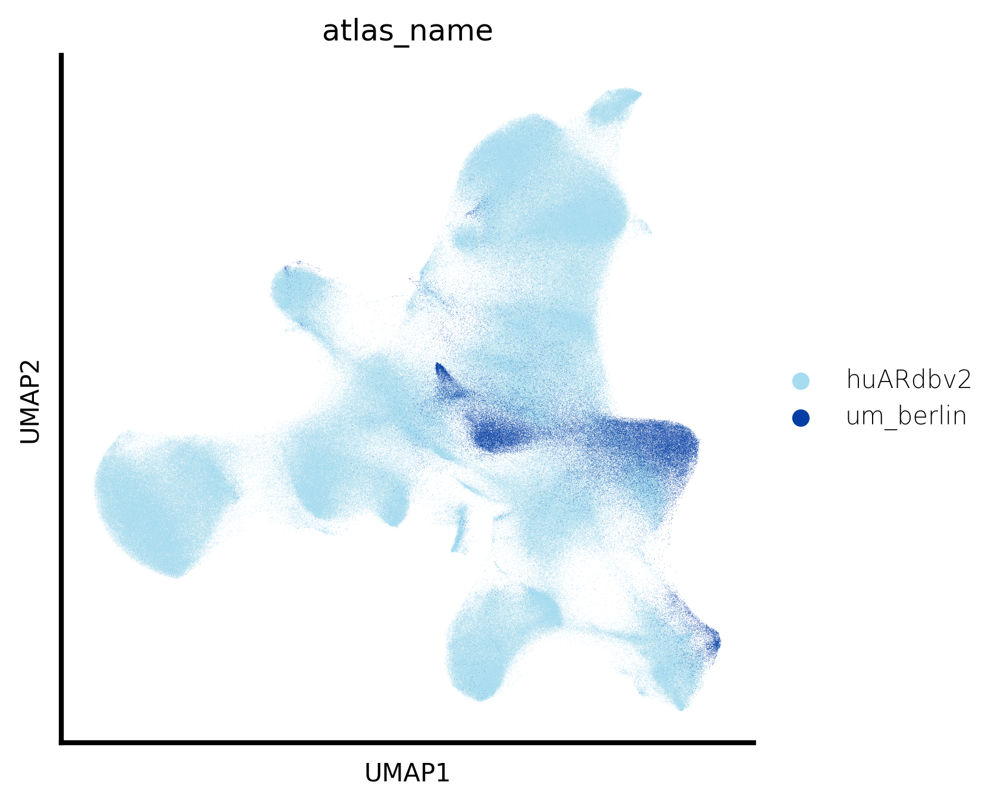

In [5]:
plt.rcParams['font.family'] = 'DejaVu Sans'
fig,ax=createFig(figsize=(5,5))
sc.pl.umap(adata_cd8_zheng_2021_merged[adata_cd8_zheng_2021_merged.obs['atlas_name'] == 'huARdbv2'], color='atlas_name', ax=ax, palette=
 {
     'um_berlin': '#053FA5',
     'huARdbv2': '#A6DCEF'
 }, show=False, s=0.1
)
sc.pl.umap(adata_cd8_zheng_2021_merged[adata_cd8_zheng_2021_merged.obs['atlas_name'] != 'huARdbv2'], color='atlas_name', ax=ax, palette=
 {
     'um_berlin': '#053FA5',
     'huARdbv2': '#A6DCEF'
 }, show=False, s=0.1
)

#fig.savefig('13_11_2025/superimopse_default.png', dpi=300, bbox_inches='tight')


In [14]:
subset = adata_cd8_zheng_2021_merged[adata_cd8_zheng_2021_merged.obs['study_name'] == 'uveal_melanoma']
subset.obs

,treatment,Annotation,disease,study_name,atlas_name,disease_type,sample_name,treatment_group,cell_subtype_3,n_counts,cell_subtype_3_prediction,cell_subtype_zheng_2021_prediction
53314-A4069-Cartridge-I3-Berlin-UM,NaN,CD8 T-Cells - Checkpoint Proteins,UM,uveal_melanoma,um_berlin,UM,DU_050,naive,undefined,1082,GZMK+ Tex,GZMK+ Tex
60757-A4069-Cartridge-I3-Berlin-UM,NaN,CD8 T-Cells - Checkpoint Proteins,UM,uveal_melanoma,um_berlin,UM,DU_050,naive,undefined,736,CREM+ Trm,CREM+ Trm
73218-A4069-Cartridge-I3-Berlin-UM,NaN,CD8 T-Cells - Checkpoint Proteins,UM,uveal_melanoma,um_berlin,UM,DU_050,naive,undefined,1025,ITGAE+ Tex,ITGAE+ Tex
82365-A4069-Cartridge-I3-Berlin-UM,NaN,CD8 T-Cells - Checkpoint Proteins,UM,uveal_melanoma,um_berlin,UM,DU_050,naive,undefined,1377,GZMK+ Tex,GZMK+ Tex
90127-A4069-Cartridge-I3-Berlin-UM,NaN,CD8 T-Cells - Cycling,UM,uveal_melanoma,um_berlin,UM,DU_050,naive,undefined,1746,Cycling T,Cycling T
...,...,...,...,...,...,...,...,...,...,...,...,...
GACGGCTCATTCTCAT-1-LH17_3554-Pandiani-et-al-2021,NaN,CD8 T-Cells,UM,uveal_melanoma,um_berlin,UM,Pandiani_LH17_3554,naive,undefined,369,Early Tcm/Tem,Early Tcm/Tem
GCGCGATCACACTGCG-1-LH17_3554-Pandiani-et-al-2021,NaN,CD8 T-Cells,UM,uveal_melanoma,um_berlin,UM,Pandiani_LH17_3554,naive,undefined,410,GZMK+ Tem,GZMK+ Tem
TACAGTGCAGTCAGAG-1-LH17_3554-Pandiani-et-al-2021,NaN,CD8 T-Cells,UM,uveal_melanoma,um_berlin,UM,Pandiani_LH17_3554,naive,undefined,586,MAIT,MAIT
TACTCATTCTTAACCT-1-LH17_3554-Pandiani-et-al-2021,NaN,CD8 T-Cells,UM,uveal_melanoma,um_berlin,UM,Pandiani_LH17_3554,naive,undefined,453,MACF1+ T,MACF1+ T


findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

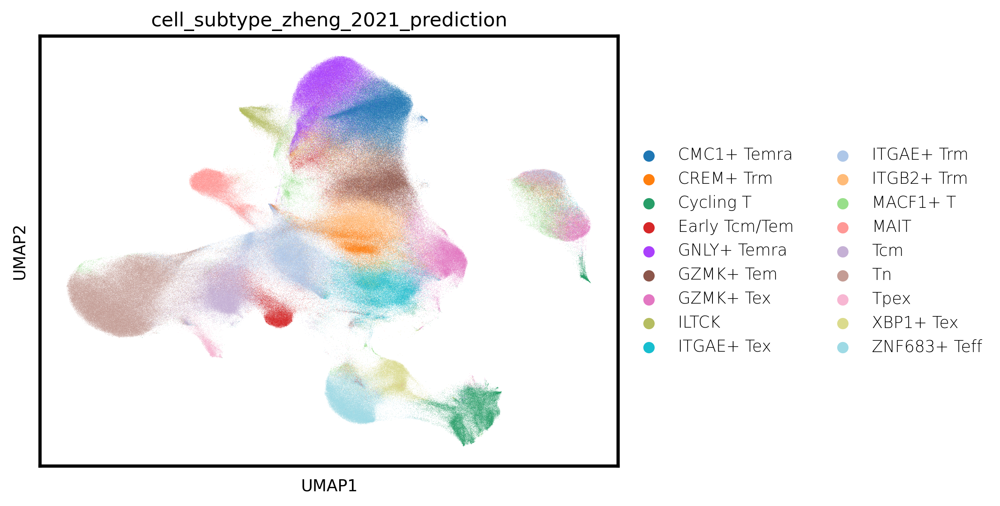

In [14]:
sc.pl.umap(adata_cd8_zheng_2021_merged, color=["cell_subtype_zheng_2021_prediction"])

In [14]:
adata_cd8_zheng_2021_merged.write_h5ad("integration_cd8_umap_11_11_default.h5ad")

In [2]:
adata_cd8_zheng_2021_merged = sc.read_h5ad("/omics/odcf/analysis/hipo/hipo_021/Rhode/um/dataset_vae/DS_files_7825/integration_cd8_umap_11_11_default_titan.h5ad")

In [ ]:
#sc.pp.neighbors(adata_cd8_zheng_2021_merged, use_rep="X_gex", n_neighbors=40)


In [3]:
#adata_cd8_zheng_2021_merged.write_h5ad("integration_cd8_umap_11_11_pp_neigh.h5ad")
#adata_cd8_zheng_2021_merged = sc.read_h5ad("integration_cd8_umap_11_11_pp_leiden.h5ad")
#adata_cd8_zheng_2021_merged 

AnnData object with n_obs × n_vars = 1210559 × 3848
    obs: 'treatment', 'Annotation', 'disease', 'study_name', 'atlas_name', 'disease_type', 'sample_name', 'treatment_group', 'cell_subtype_3', 'n_counts', 'cell_subtype_3_prediction', 'cell_subtype_zheng_2021_prediction', 'leiden_new'
    uns: 'cell_subtype_3_prediction_colors', 'cell_subtype_3_prediction_logits', 'leiden', 'neighbors'
    obsm: 'X_gex', 'X_umap'
    obsp: 'connectivities', 'distances'

In [ ]:
# This uses the new graph to find clusters
#sc.tl.leiden(adata_cd8_zheng_2021_merged, resolution=1.2, key_added="leiden_new")


In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

_, fig = scatlasvae.tl.cell_type_alignment(
    subset,
    obs_1='Annotation',
    obs_2='cell_subtype_zheng_2021_prediction',
    perc_in_obs_1=0.1
)
#fig.show(renderer="png")
#fig.show(renderer="browser")
fig.write_image("13_11_2025/celltype_21_9_default.pdf")
#fig.write_image("cell_type_alignment2.png")



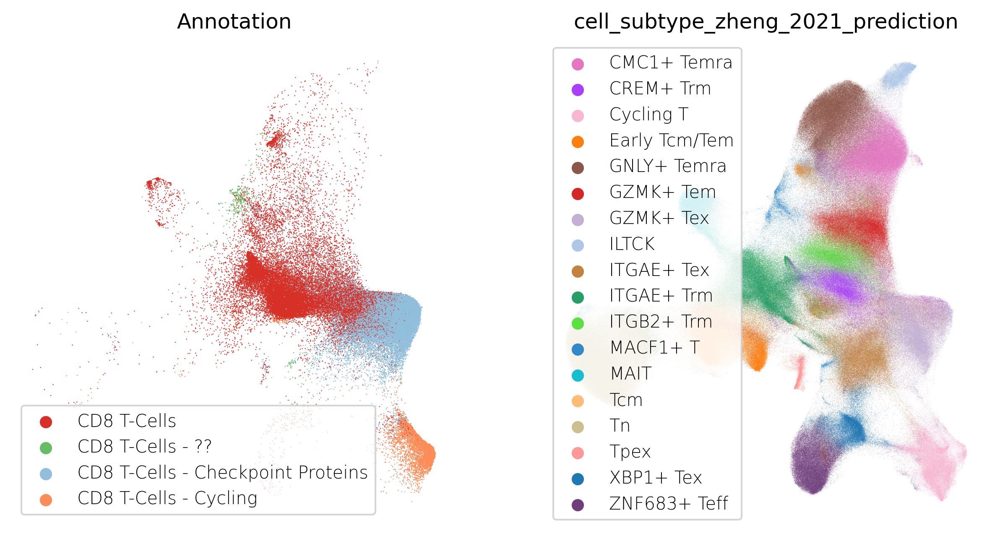

<Figure size 1920x1440 with 0 Axes>

In [19]:
# Create subplots with proper figure handling
plt.rcParams['font.family'] = 'DejaVu Sans'
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# First UMAP (Final Annotation)
sc.pl.umap(
    adata_cd8_zheng_2021_merged[adata_cd8_zheng_2021_merged.obs['Annotation'] != 'undefined'],
    color='Annotation',
    palette=zheng_2021_annotation_cmap_cd8,
    ax=ax[0],
    show=False,
    frameon=False,
    legend_loc= "best"
)

# Second UMAP (Subtypes)
sc.pl.umap(
    adata_cd8_zheng_2021_merged[adata_cd8_zheng_2021_merged.obs['cell_subtype_zheng_2021_prediction'] != 'undefined'],
    color='cell_subtype_zheng_2021_prediction',
    ax=ax[1],
    palette=subtype_color,
    frameon=False,
    legend_loc= "best"
)

# Adjust layout and save
plt.tight_layout()
fig.savefig('13_11_2025/umap_integration_sep_anno.png', dpi=300, bbox_inches='tight')


In [ ]:
#adata_cd8_zheng_2021_merged.obs
adata_cd8_zheng_2021_merged.obs["Annotation"].unique()

In [41]:
sc.pl.umap(
    adata_cd8_zheng_2021_merged[adata_cd8_zheng_2021_merged.obs['cell_subtype_3'] != 'undefined'],
    color='cell_subtype_3',
    ax=ax[1],
    palette=subtype_color,
    frameon=False,
    legend_loc='none'
)


In [ ]:
#zheng_2021_annotation_cmap_cd8['CD8.c11.Tex.PDCD1'] = '#21D5CE'
#fig,ax=createSubplots(1,2,figsize=(10,5))
#sc.pl.umap(adata_cd8_zheng_2021_merged[
#    adata_cd8_zheng_2021_merged.obs['cell_subtype_zheng_2021'] != 'undefined'
#], color='cell_subtype_zheng_2021', ax=ax[0], show=False, palette=zheng_2021_annotation_cmap_cd8, frameon=False, legend_loc='none')
#sc.pl.umap(adata_cd8_zheng_2021_merged[
#    adata_cd8_zheng_2021_merged.obs['cell_subtype_3'] != 'undefined'
#], color='cell_subtype_3', ax=ax[1], palette=subtype_color, frameon=False, legend_loc='none')

In [ ]:
#zheng_2021_annotation_cmap_cd8['CD8.c11.Tex.PDCD1'] = '#21D5CE'
# fig,ax=createSubplots(1,2,figsize=(10,5))
# sc.pl.umap(adata_cd8_zheng_2021_merged[
#     adata_cd8_zheng_2021_merged.obs['disease'] == 'UM'
# ], color='cell_subtype_3', ax=ax[0], show=False, frameon=False)
# sc.pl.umap(adata_cd8_zheng_2021_merged[
#     adata_cd8_zheng_2021_merged.obs['cell_subtype_3'] != 'undefined'
# ], color='cell_subtype_3', ax=ax[1], palette=subtype_color, frameon=False, legend_loc='none')
# # Adjust layout and save
# plt.tight_layout()
# fig.savefig('umap_comparison2.png', dpi=300, bbox_inches='tight')
# This uses the new UMAP coordinates and the new cluster labels
plt.rcParams['font.family'] = 'DejaVu Sans'
sc.pl.umap(adata_cd8_zheng_2021_merged, color=['leiden_new'],x=ax, palette=subtype_color)

In [8]:
plt.rcParams['font.family'] = 'DejaVu Sans'
sc.pl.umap(adata_cd8_zheng_2021_merged, color="cell_subtype_zheng_2021_prediction", ax=ax, palette=subtype_color)


NameError: name 'ax' is not defined

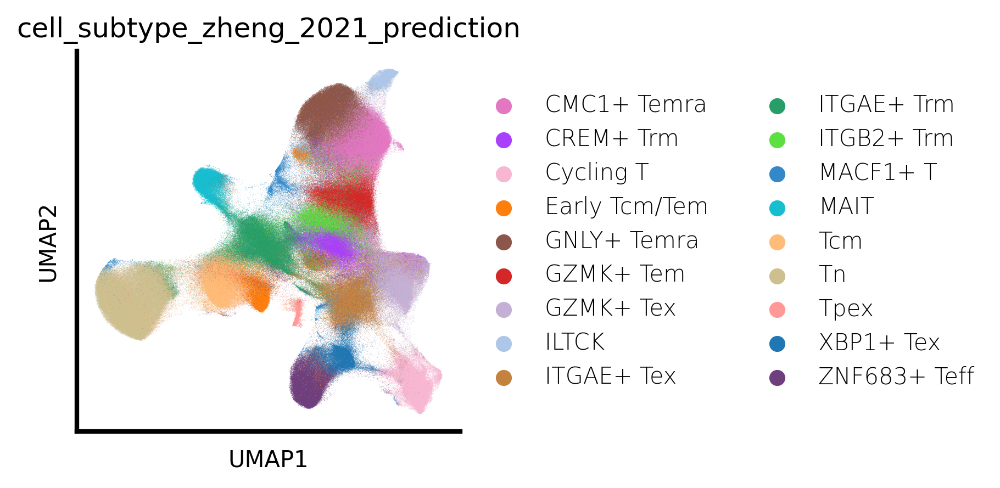

In [4]:
#plt.savefig("umap_plot.png", dpi=300, bbox_inches='tight')plt.rcParams['font.family'] = 'DejaVu Sans'
plt.rcParams['font.family'] = 'DejaVu Sans'

fig, ax = createFig(figsize=(3, 3))
sc.pl.umap(adata_cd8_zheng_2021_merged, color="cell_subtype_zheng_2021_prediction", ax=ax, palette=subtype_color)

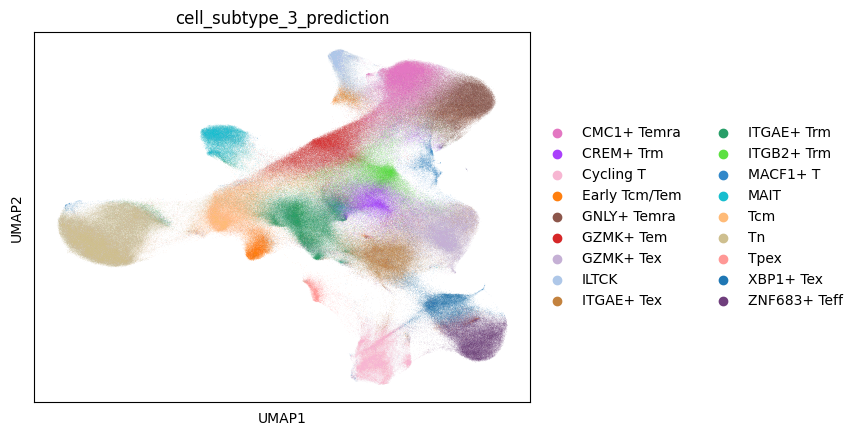

In [5]:
plt.rcParams['font.family'] = 'DejaVu Sans'
sc.pl.umap(adata_cd8_zheng_2021_merged, color=["cell_subtype_3_prediction"])

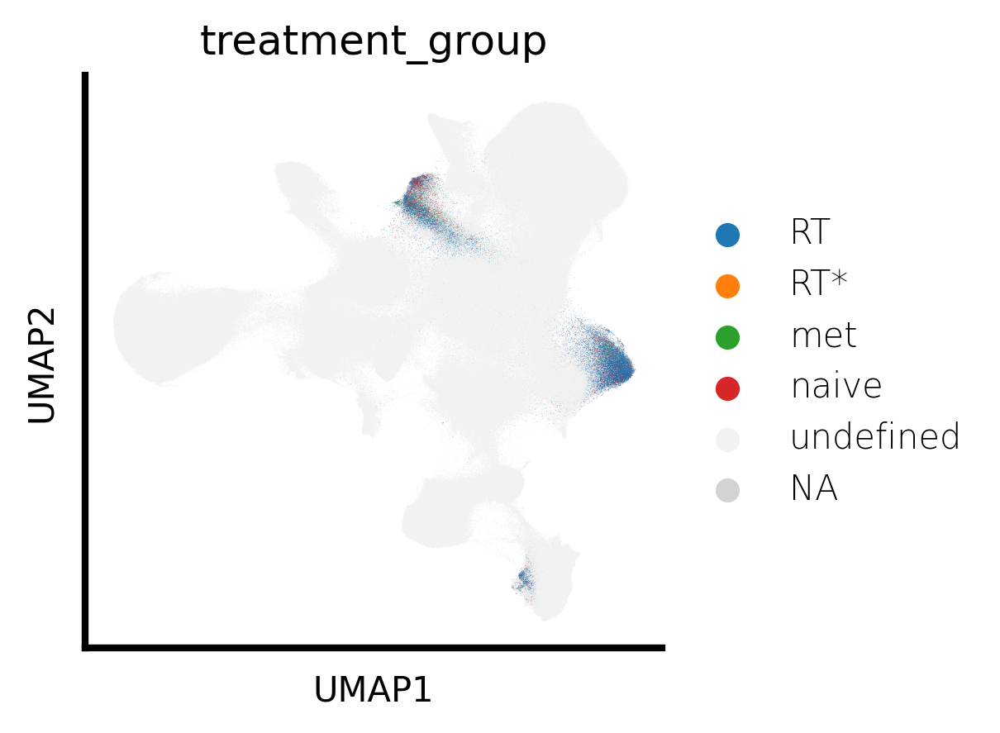

In [52]:
plt.rcParams['font.family'] = 'DejaVu Sans'
fig, ax = createFig(figsize=(3, 3))
# Define colors for all categories in cnv_group
palette_dict = {
    'RT': '#1f77b4',
    'RT*': '#ff7f0e',
    'met': '#2ca02c',
    'naive': '#d62728',
    'undefined': '#f2f2f2'
}
sc.pl.umap(adata_cd8_zheng_2021_merged, color="treatment_group", ax=ax, palette=palette_dict)

#sc.pl.umap(
#    adata_cd8_zheng_2021_merged[adata_cd8_zheng_2021_merged.obs['cell_subtype_3_prediction'] != 'undefined'],
#    color='cell_subtype_3_prediction',
#    ax=ax[1],
#    palette=subtype_color,
#    frameon=False,
#    legend_loc='none'
#)
fig.savefig('umap_treatment_group_21_9_default.png', dpi=300, bbox_inches='tight')

In [ ]:
fig, ax = createFig(figsize=(3, 3))
sc.pl.umap(adata_cd8_zheng_2021_merged, color="disease", ax=ax)
#plt.savefig("umap_disease.png", dpi=300, bbox_inches='tight')

In [14]:
plt.rcParams['font.family'] = 'DejaVu Sans'
fig, ax = createFig(figsize=(3, 3))
sc.pl.umap(adata_cd8_zheng_2021_merged, color="cell_subtype_3_prediction", ax=ax, palette=subtype_color)

#sc.pl.umap(
#    adata_cd8_zheng_2021_merged[adata_cd8_zheng_2021_merged.obs['cell_subtype_3_prediction'] != 'undefined'],
#    color='cell_subtype_3_prediction',
#    ax=ax[1],
#    palette=subtype_color,
#    frameon=False,
#    legend_loc='none'
#)
fig.savefig('umap_21_default.png', dpi=300, bbox_inches='tight')

In [ ]:
plt.rcParams['font.family'] = 'DejaVu Sans'
fig, ax = createFig(figsize=(3, 3))
sc.pl.umap(adata_cd8_zheng_2021_merged, color="cell_subtype_3_prediction", ax=ax, palette=subtype_color)

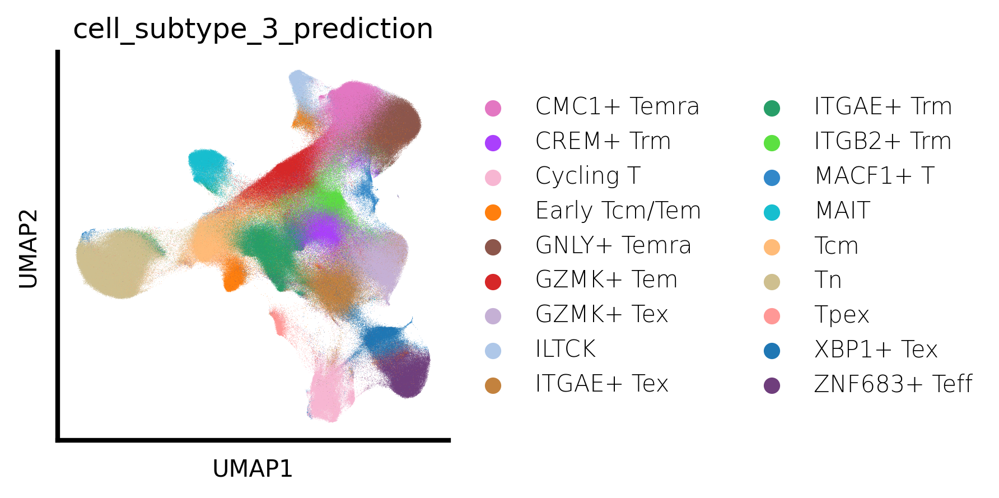

In [ ]:
fig, ax = createFig(figsize=(3, 3))
sc.pl.umap(adata_cd8_zheng_2021_merged, color="cell_subtype_3_prediction", ax=ax, palette=subtype_color)


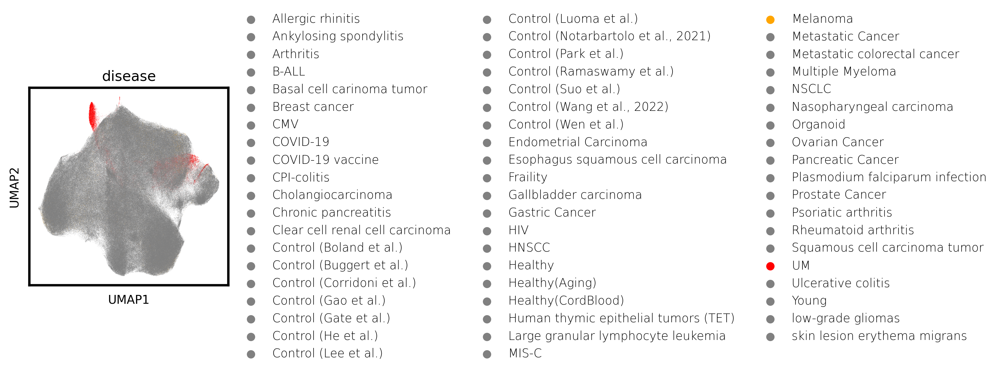

In [21]:
custom_palette = {
    "UM": "red",         # Color for UM
    "Melanoma": "orange",  # Color for melanoma
}

# Get unique categories in the 'disease' column
all_categories = adata_cd8_zheng_2021_merged.obs["disease"].unique()

# Assign gray color to all other categories
for category in all_categories:
    if category not in custom_palette:
        custom_palette[category] = "gray"

# Create figure
fig, ax = plt.subplots(figsize=(3, 3))

# Plot UMAP with custom colors
sc.pl.umap(adata_cd8_zheng_2021_merged, color="disease", ax=ax, palette=custom_palette)


In [ ]:
fig,ax=createFig(figsize=(5,5))
sc.pl.umap(adata_cd8_zheng_2021_merged[adata_cd8_zheng_2021_merged.obs['atlas_name'] == 'huARdbv2'], color='atlas_name', ax=ax, palette=
 {
     'um_berlin': '#053FA5',
     'huARdbv2': '#A6DCEF'
 }, show=False, s=1
)
sc.pl.umap(adata_cd8_zheng_2021_merged[adata_cd8_zheng_2021_merged.obs['atlas_name'] != 'huARdbv2'], color='atlas_name', ax=ax, palette=
 {
     'um_berlin': '#053FA5',
     'huARdbv2': '#A6DCEF'
 }, show=False, s=1
)
#fig.savefig("/Users/snow/Desktop/tmp.png")

In [ ]:
sc.pl.umap(adata_cd8_zheng_2021_merged[
    adata_cd8_zheng_2021_merged.obs['cell_subtype_3_prediction'] != 'undefined'
], color='cell_subtype_3_prediction', ax=ax[1], palette=subtype_color, frameon=False, legend_loc='none')

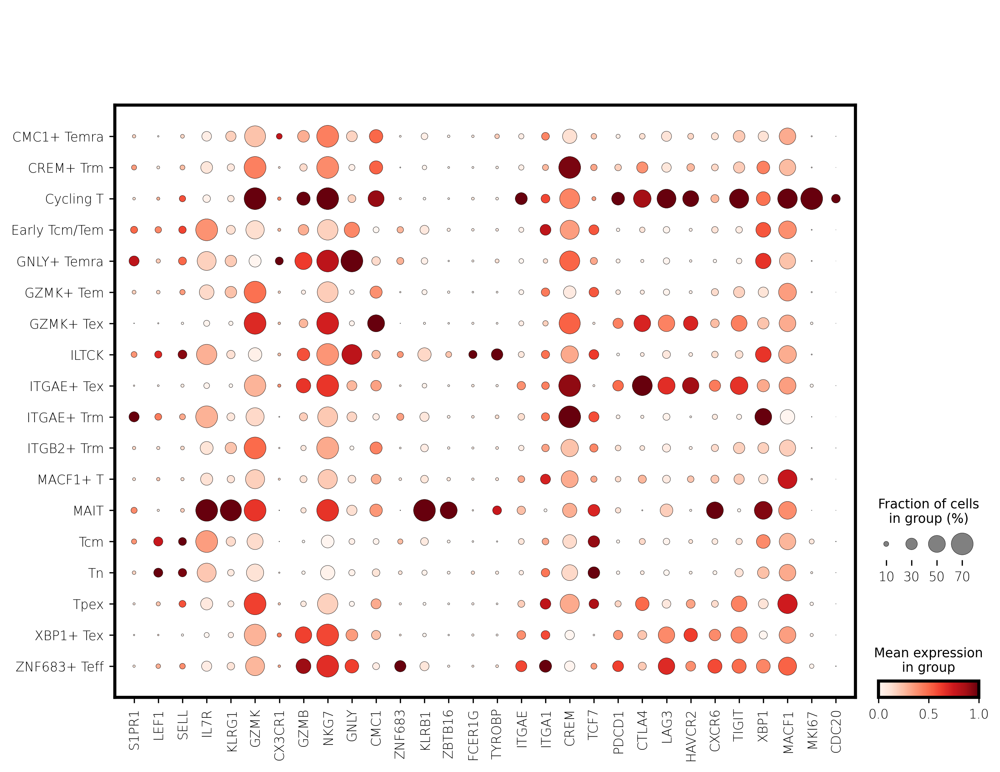

In [20]:
## Cell subtype marker, Figure1C
## Cell subtype marker, Figure1C
plt.rcParams['font.family'] = 'DejaVu Sans'

fig,ax = plt.subplots(figsize=(10,8))
sc.pl.dotplot(subset, var_names=['S1PR1', 'LEF1', 'SELL', 'IL7R', 
                                     'KLRG1', 'GZMK', 'CX3CR1', 'GZMB', 'NKG7',
                                     'GNLY', 'CMC1', 'ZNF683',
                                     'KLRB1', 'ZBTB16', 'FCER1G', 'TYROBP',
                                     'ITGAE', 'ITGA1', 'CREM', 
                                     'TCF7', 'PDCD1', 'CTLA4',
                                     'LAG3', 'HAVCR2',
                                     'CXCR6', 'TIGIT', 'XBP1',
                                     'MACF1', 'MKI67', 'CDC20'], 
              groupby='cell_subtype_3_prediction', dot_max=0.7, ax=ax,
              standard_scale='var')
#fig.savefig('figures/Figure2B_marker_genes.pdf')

In [38]:
adata_cd8.obs['disease_type'].unique()

['Healthy', 'Infection', 'Inflammation', 'Fraility', 'Solid tumor', 'Leukemia', 'Myeloma', 'Organoid', 'irAE_inflammation']
Categories (9, object): ['Fraility', 'Healthy', 'Infection', 'Inflammation', ..., 'Myeloma', 'Organoid', 'Solid tumor', 'irAE_inflammation']

In [ ]:
## color_palette
subtype_color = {
    'Tn':'#CEBF8F',
    'Tcm':'#ffbb78',
    'Early Tcm/Tem':'#ff7f0e',
    'GZMK+ Tem':'#d62728',
    'GNLY+ Temra':'#8c564b',
    'CMC1+ Temra':'#e377c2',
    'ZNF683+ Teff':'#6f3e7c',
    'MAIT':'#17becf',
    'ILTCK':'#aec7e8',
    'ITGAE+ Trm':'#279e68',
    'CREM+ Trm':'#aa40fc',
    'ITGB2+ Trm':'#5ce041',
    'Tpex':'#ff9896',
    'GZMK+ Tex':'#9f80b8',
    'ITGAE+ Tex':'#e8c0ba',
    'XBP1+ Tex':'#b5bd61',
    'MACF1+ T':'#3288c9',
    'Cycling T':'#f7b6d2'
}

main_type_color = {
    'Tn':'#CEBF8F',
    'Tcm/Tem':'#ff7f0e',
    'Temra':'#8c564b',
    'MAIT':'#17becf',
    'ILTCK':'#aec7e8',
    'Trm':'#279e68',
    'Tex':'#e8c0ba',
    'MACF1+T':'#3288c9',
    'CyclingT':'#f7b6d2'
}

disease_type_color = {
    'Healthy':"#E84C36",
    'Infection':"#4CBDD7",
    'Inflammation':"#1DA088",
    'irAE_inflammation':"#3C5589",
    'Solid tumor':"#F49C7F",
    'Myeloma':"#8492B5",
    'Leukemia':"#91D1C2",
    'Fraility':'#1f77b4',
    'Organoid':'#aa40fc',
    "undefined":"#808080"
}

meta_tissue_type_color = {
    "Circulating":'#ff7f0e',
    "Tissue":'#1f77b4',
    "TIL":'#279e68',
    "Others":'#aa40fc',
}

tissue_type_color = {
    'PBMC':'#ffbb78',
    'Bone Marrow':'#b5bd61',
    'Spleen':'#ff817b',
    'Lymph Node':'#e377c2',
    'Normal Tissue':'#aec7e8',
    'Paratumor Tissue':'#c5b0d5',
    'Inflamed Tissue':'#8c564b',
    'Infected Tissue':'#ff9896',
    'TIL':'#98df8a',
    'st_PBMC':'#17becf',
    'PBMC/BALF':'#939292',
    'Organoid':'#aa40fc',
    'Thymus':'#B0BEC5',
}

sorting_color = {
    'normal_CD8': '#E6DCD9',
    'mem_CD8': '#FFAF00',
    'PD1_CD8': '#389663',
    'CD39_CD8': '#8256ED',
    'st_CD8':'#BBD400',
    'ag_specific': '#FF5F5F',
    'sorted_CD4': '#009EB2',
    'undetermined': '#7F7F7F'
}


fig,ax = plt.subplots(figsize=(5,5))
sc.pl.umap(adata_cd8_zheng_2021_merged, color='disease', palette=disease_type_color, size=2, ax=ax)

plt.savefig("13_11_2025/umap_disease.png", dpi=300, bbox_inches='tight')

In [ ]:
plt.rcParams['font.family'] = 'DejaVu Sans'

fig,ax = plt.subplots(figsize=(5,5))
sc.pl.umap(adata_cd8_zheng_2021_merged, color='disease', palette=disease_type_color, size=2)
fig.savefig('S7_disease_type.png')

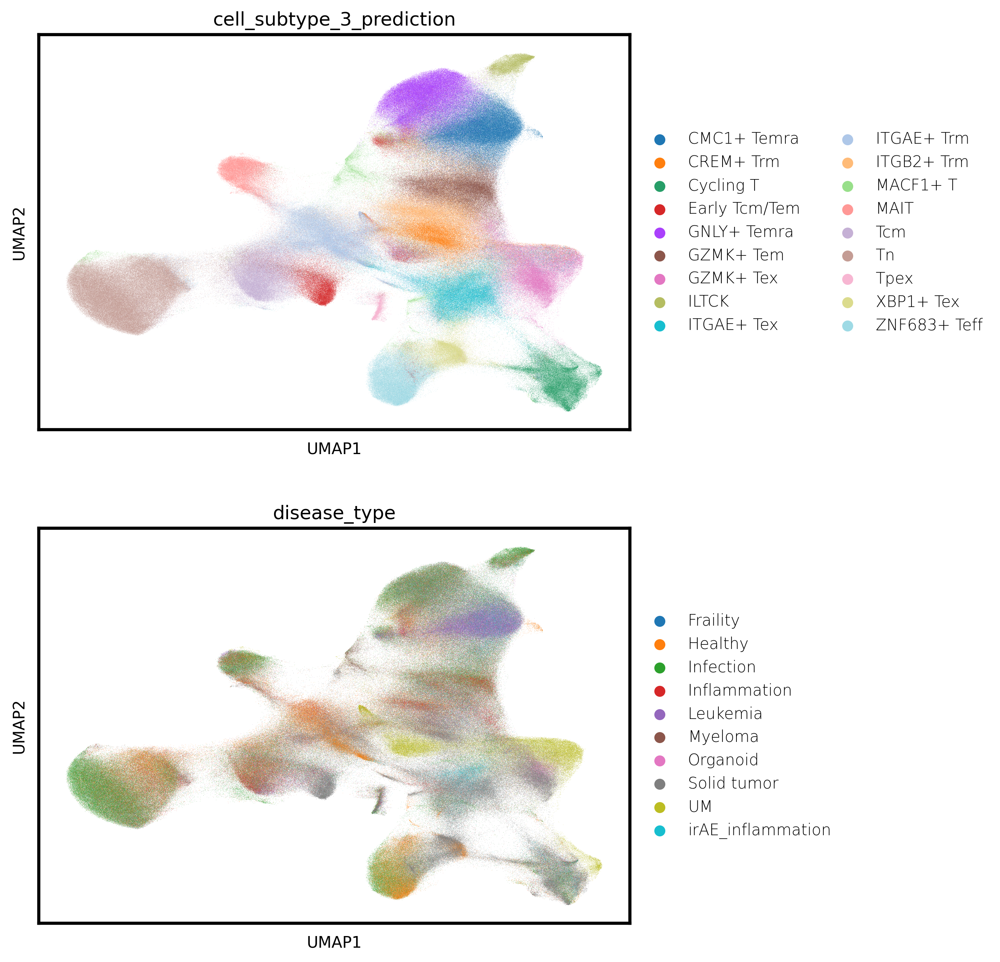

In [23]:
fig = sc.pl.umap(
    adata_cd8_zheng_2021_merged,
    color=["cell_subtype_3_prediction", "disease_type"],
    ncols=1,
    return_fig=True  # <-- make it return a matplotlib Figure
)
fig.savefig("13_11_2025/umap_prediction_diseases.png", dpi=300, bbox_inches="tight")


In [4]:
adata_cd8_zheng_2021_merged.raw = adata_cd8_zheng_2021_merged.copy()

In [5]:
# create a new object with lognormalized counts
#adata_combat = sc.AnnData(X=adata_cd8_zheng_2021_merged.raw.X, var=adata_cd8_zheng_2021_merged.raw.var, obs = adata_cd8_zheng_2021_merged.obs)
# first store the raw data 
#adata_combat.raw = adata_combat

In [ ]:
# run combat
#sc.pp.combat(adata_combat, key='sample_name')

In [4]:
sc.pp.normalize_total(adata_cd8_zheng_2021_merged, target_sum=1e4)
sc.pp.log1p(adata_cd8_zheng_2021_merged)

In [5]:
sc.pp.highly_variable_genes(adata_cd8_zheng_2021_merged)
sc.pp.scale(adata_cd8_zheng_2021_merged)

In [6]:
sc.tl.pca(adata_cd8_zheng_2021_merged)

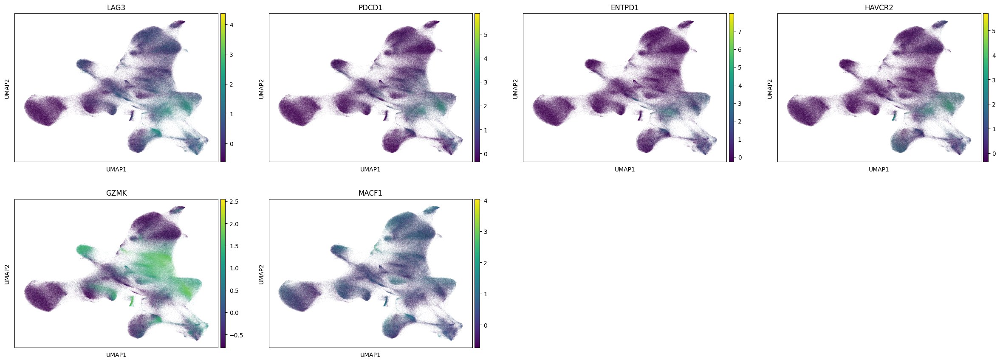

In [7]:
sc.pl.umap(
    adata_cd8_zheng_2021_merged,
    color=['LAG3', 'PDCD1', 'ENTPD1', 'HAVCR2', 'GZMK','MACF1'],
    show=True
)
#plt.savefig("13_11_2025/umap_markers.png", dpi=300, bbox_inches='tight')


['DU' 'Bakhoum' 'Bigot' 'Durante' 'Güc' 'Karlsson' 'Nieto' 'Pandiani']


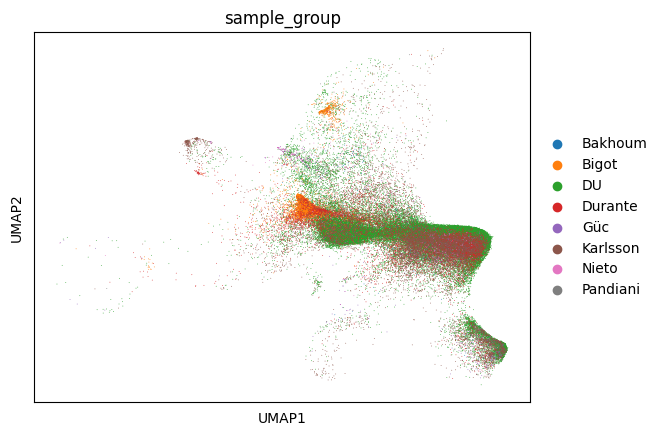

In [19]:
import scanpy as sc
import pandas as pd

# Create a new column grouping by prefix
subset.obs["sample_group"] = subset.obs["sample_name"].str.extract(r"(^[^_]+)")[0]

# Optional: check the unique groups
print(subset.obs["sample_group"].unique())

# Plot with groups
fig = sc.pl.umap(
    subset,
    color=["sample_group"],  # color by new grouping
    ncols=1,
    return_fig=True
)

# Save figure
#fig.savefig("13_11_2025/umap_grouped.png", dpi=300, bbox_inches="tight")


In [ ]:
sc.pp.combat(adata_cd8_zheng_2021_merged, key='sample_name')


In [2]:
adata_cd8_zheng_2021_merged = sc.read_h5ad("integration_cd8_combat.h5ad")

In [3]:
adata_combat = adata_cd8_zheng_2021_merged

AnnData object with n_obs × n_vars = 1210559 × 3848
    obs: 'treatment', 'Annotation', 'disease', 'study_name', 'atlas_name', 'disease_type', 'sample_name', 'treatment_group', 'cell_subtype_3', 'n_counts', 'cell_subtype_3_prediction', 'cell_subtype_zheng_2021_prediction'

In [ ]:
sc.pp.highly_variable_genes(adata_combat)
print("Highly variable genes: %d"%sum(adata_combat.var.highly_variable))

In [ ]:
sc.pl.highly_variable_genes(adata_combat)

In [15]:

# Then compute embeddings once
adata_cd8_zheng_2021_merged.obsm['X_gex'] = multi_atlas_vae_model.get_latent_embedding()
adata_cd8_zheng_2021_merged.obsm['X_umap'] = umap.UMAP(random_state=42).fit_transform(
    adata_cd8_zheng_2021_merged.obsm['X_gex']
)

# Get predictions
predictions = multi_atlas_vae_model.predict_labels(return_pandas=True)
predictions_logits = multi_atlas_vae_model.predict_labels(return_pandas=False)
adata_cd8_zheng_2021_merged.uns['cell_subtype_3_prediction_logits'] = predictions_logits[0].detach().cpu().numpy()
adata_cd8_zheng_2021_merged.obs['cell_subtype_3_prediction'] = list(predictions['cell_subtype_3'])
adata_cd8_zheng_2021_merged.obs['cell_subtype_zheng_2021_prediction'] = list(predictions['cell_subtype_3'])


Predicting Labels: 100%|██████████| 9458/9458 [07:16<00:00, 21.65it/s]
